<h2 align='center'> Part 1 (spectral unmixing) </h2>

### (A): (i):


In [1]:
import numpy as np,pandas as pd, scipy.io as sio
from scipy.optimize import nnls,minimize
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
import warnings




Pavia = sio.loadmat('PaviaU_cube.mat')
HSI = Pavia['X'] #Pavia HSI : 300x200x103

ends = sio.loadmat('PaviaU_endmembers.mat') # Endmember's matrix: 103x9
endmembers = ends['endmembers']

#Perform unmixing for the pixels corresponding to nonzero labels
ground_truth= sio.loadmat('PaviaU_ground_truth.mat')
labels=ground_truth['y']


# Assign endmembers as X for convenience
X = endmembers

# Initialize the Standard Scaler()
scaler  = StandardScaler()

# Create LASSO object
lasso = Lasso(alpha=1.0, max_iter=5000)

# Initialize the method with the least square methods
class LeastSquares:

    # Least squares method with no constraints
    def get_theta_no_constrains(i, j):

        # Extract the spectral signature
        px_spectral_signature = HSI[i,j, :]

        # Calculate the inverse of X.T @ X
        X_T_X_inv = np.linalg.inv(X.T @ X)

        # Calculate the X.T @ y
        X_T_y = X.T @ px_spectral_signature

        # Get the abundance vector theta (expected 9 dimensions)
        abundance_vector = X_T_X_inv @ X_T_y

        # Calculate the reconstruction error for given pixel
        recon_error = np.square(
            np.linalg.norm(px_spectral_signature - X @ abundance_vector))

        return abundance_vector, recon_error



    # Get abundance vector with sum-to-one constraint
    def get_theta_sumToOne(i, j):

        # Extract the spectral signature of the ith, jth pixel
        px_spectral_signature  = HSI[i, j, :]


        # Objective function to minimize
        objective_func = lambda theta: np.linalg.norm(px_spectral_signature - X @ theta )**2

        # Constraint: sum-to-one
        constraint = ({'type': 'eq', 'fun': lambda theta: np.sum(theta) - 1})

        # Initial guess for the abundance vector
        initial_guess = np.ones(X.shape[1]) / X.shape[1]

        # Minimize the objective function subject to the constraint
        result = minimize(objective_func, initial_guess, constraints=constraint)

        # Get the optimized abundance vector
        abundance_vector = result.x


        # Calculate the reconstruction error for given pixel
        recon_error =  np.square(
            np.linalg.norm(px_spectral_signature - X @ abundance_vector))

        return abundance_vector, recon_error


    # Get abundance vector with the non negativity constraint
    def get_theta_nonNeg(i, j):

        # Extract the spectral signature
        px_spectral_signature = HSI[i, j, :]

        # Get the abundance vector theta (expected 9 dimensions)
        abundance_vector, _ = nnls(X, px_spectral_signature)

        # Calculate the reconstruction error for given pixel
        recon_error = np.square(
            np.linalg.norm(px_spectral_signature - X @ abundance_vector))

        return abundance_vector, recon_error




    # Get abundance vector with sum-to-one and non-negativity constraints
    def get_theta_both_con(i, j):
        # Extract the spectral signature
        px_spectral_signature = HSI[i, j, :]

        # Get the abundance non-negative vector theta (expected 9 dimensions)
        abundance_vector, _ = nnls(X, px_spectral_signature)

        # Objective function
        objective_function = lambda theta: np.linalg.norm(px_spectral_signature - X @ theta)**2

        # Constraint: sum-to-one
        constraint_sum_to_one = {'type': 'eq', 'fun': lambda theta: np.sum(theta) - 1}

        # Constraint: non-negativity
        constraint_non_negativity = {'type': 'ineq', 'fun': lambda theta: theta}

        # Combine both constraints
        constraints = [constraint_sum_to_one, constraint_non_negativity]

        # Initial guess for the abundance vector
        initial_guess = np.ones_like(abundance_vector) / len(abundance_vector)

        # Minimize the objective function subject to the constraints
        result = minimize(objective_function, initial_guess, constraints=constraints)

        # Get the optimized abundance vector
        abundance_vector = result.x

        # Calculate the reconstruction error for the given pixel
        recon_error = np.square(np.linalg.norm(px_spectral_signature - X @ abundance_vector))

        return abundance_vector, recon_error


    def get_theta_lasso(i, j):

        # Extract the spectral signature
        px_spectral_signature = HSI[i, j, :]

        # Scale data before LASSO implementation
        X_scaled = scaler.fit_transform(X)


        warnings.filterwarnings(action='ignore')

        # Fit the model
        lasso.fit(X_scaled, px_spectral_signature)

        # Get the abundance vector
        abundance_vector = lasso.coef_

        # Calculate the reconstruction error for given pixel
        recon_error = np.square(
            np.linalg.norm(px_spectral_signature - X @ abundance_vector))

        return abundance_vector, recon_error


# Lists to store results
thetas_no_constraints = []
thetas_sum_to_one = []
thetas_non_neg = []
thetas_both_constraints = []
thetas_lasso = []
valid_px = []

recon_error_list_1 = []
recon_error_list_2 = []
recon_error_list_3 = []
recon_error_list_4 = []
recon_error_list_5 = []

# Loop over each pixel
for i in range(HSI.shape[0]): # For i in range 300
    for j in range(HSI.shape[1]): # For in range 200 as HSI is 300x200x103
        # Get the label for each pixel
        material_label = labels[i, j] # labels is also 300x200 array corresponding to first 2 dims of HSI!

        # If the label of the pixel is non-zero proceed
        if material_label != 0:
            valid_px.append(f"{i},{j}")

            # Get the abundance vector , for 5 different methods, for each pixel under study.
            theta_no_con, recon_error_1 = LeastSquares.get_theta_no_constrains(i, j)
            theta_sumToOne, recon_error_2 = LeastSquares.get_theta_sumToOne(i, j)
            theta_non_negative, recon_error_3 = LeastSquares.get_theta_nonNeg(i, j)
            theta_both_cons, recon_error_4 = LeastSquares.get_theta_both_con(i, j)
            theta_LASSO, recon_error_5 = LeastSquares.get_theta_lasso(i, j)


            # Store the results in the corresponding lists of each method under use.
            thetas_no_constraints.append(theta_no_con)
            thetas_sum_to_one.append(theta_sumToOne)
            thetas_non_neg.append(theta_non_negative)
            thetas_both_constraints.append(theta_both_cons)
            thetas_lasso.append(theta_LASSO)

            # Store the results in the corresponding lists of each method
            # for the reconstruction

            recon_error_list_1.append(recon_error_1)
            recon_error_list_2.append(recon_error_2)
            recon_error_list_3.append(recon_error_3)
            recon_error_list_4.append(recon_error_4)
            recon_error_list_5.append(recon_error_5)

# After the loop, create DataFrames for each set of results
df_no_constraints = pd.DataFrame(data={'AbundanceVector': thetas_no_constraints, 'PixelReconError':recon_error_list_1, 'ValidPixelLabel': valid_px})
df_sum_to_one = pd.DataFrame(data={'AbundanceVector': thetas_sum_to_one, 'PixelReconError':recon_error_list_2, 'ValidPixelLabel': valid_px})
df_non_neg = pd.DataFrame(data={'AbundanceVector': thetas_non_neg, 'PixelReconError':recon_error_list_3, 'ValidPixelLabel': valid_px})
df_both_constraints = pd.DataFrame(data={'AbundanceVector': thetas_both_constraints, 'PixelReconError':recon_error_list_4, 'ValidPixelLabel': valid_px})
df_lasso = pd.DataFrame(data={'AbundanceVector': thetas_lasso, 'PixelReconError':recon_error_list_5, 'ValidPixelLabel': valid_px})

<h2 align='Center'> Abundance maps</h2>

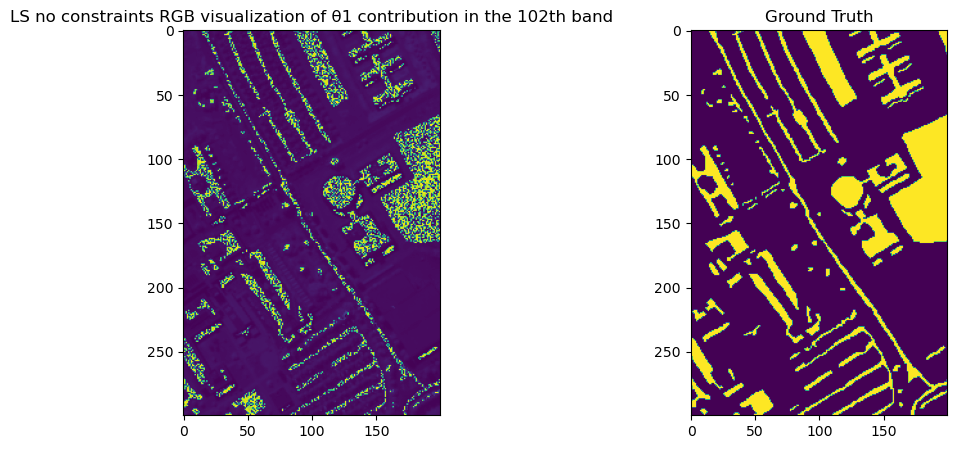

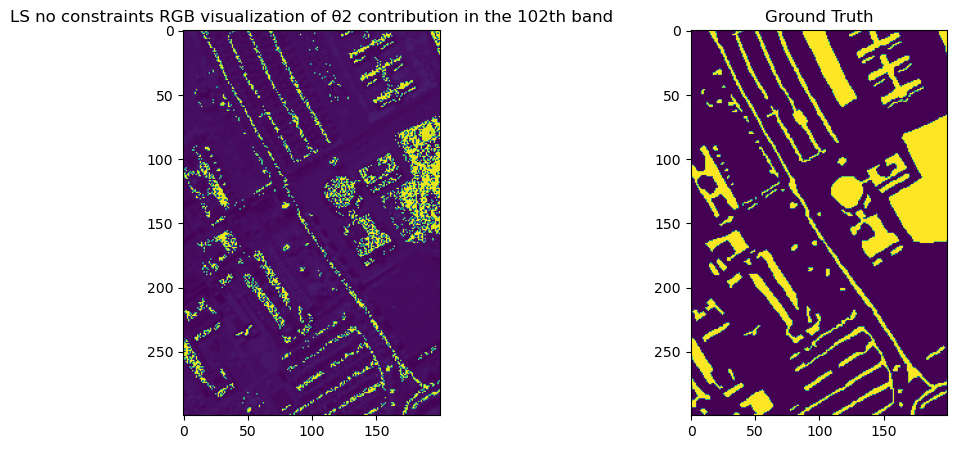

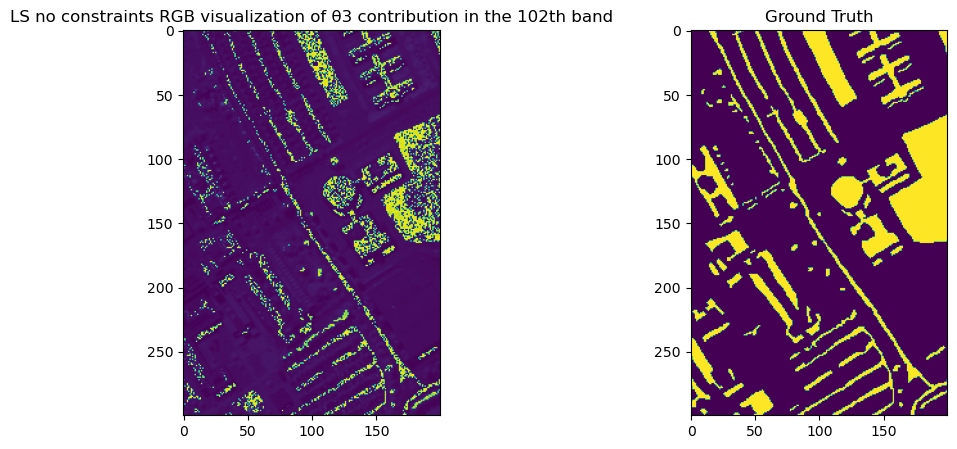

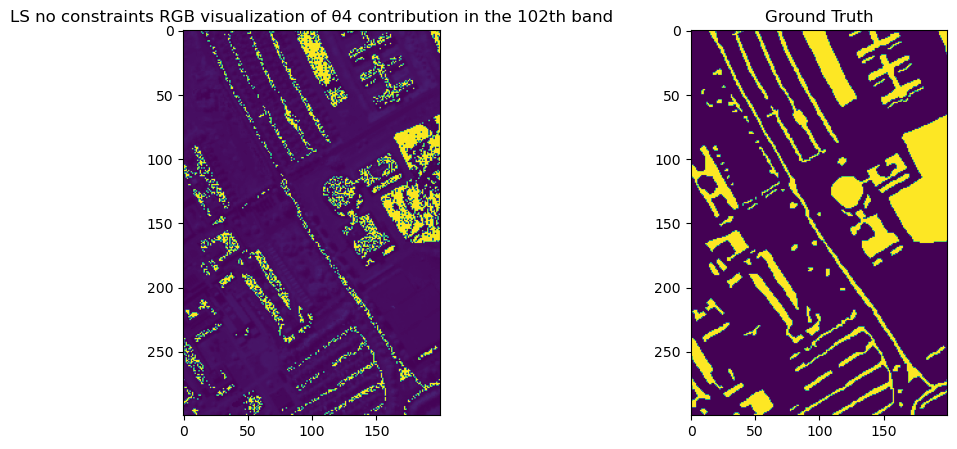

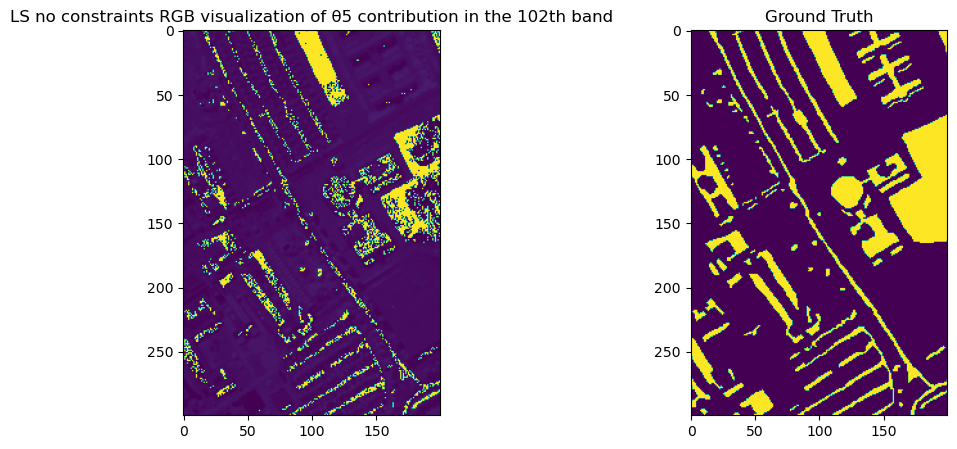

...

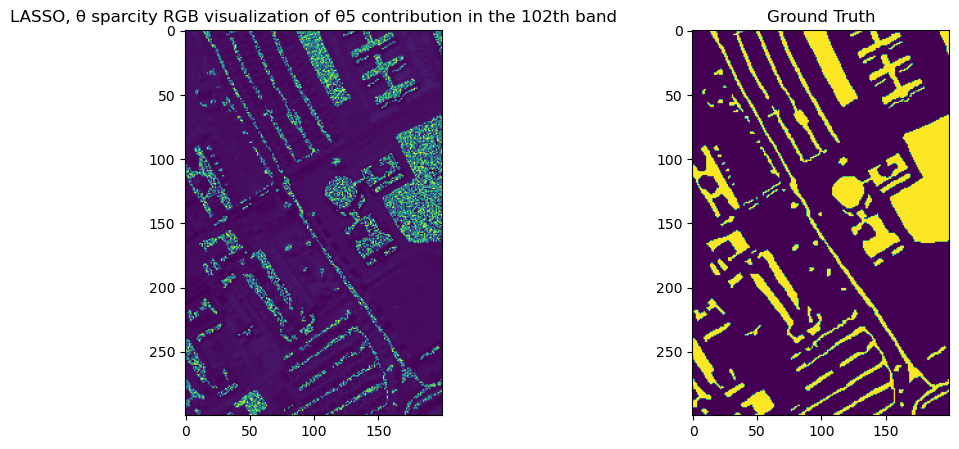

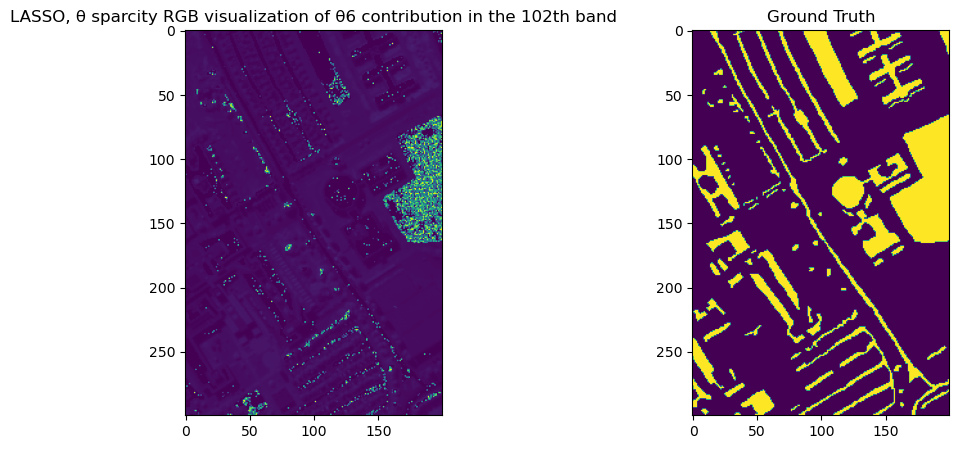

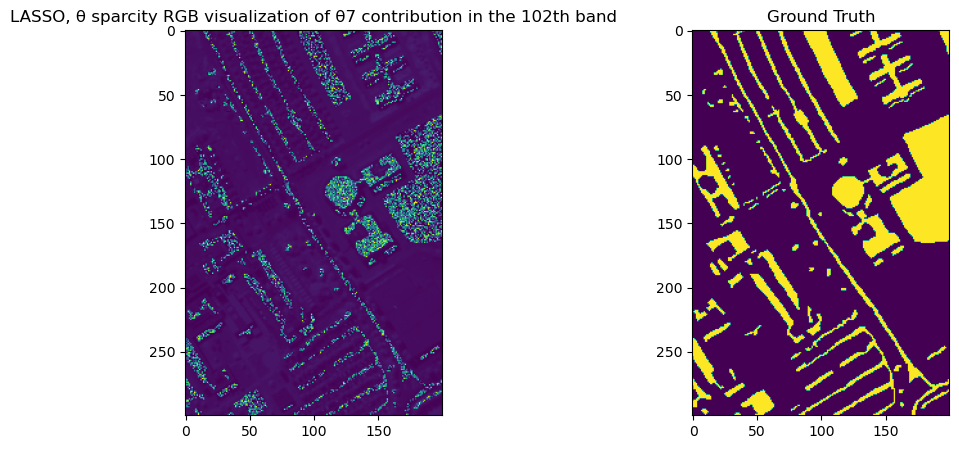

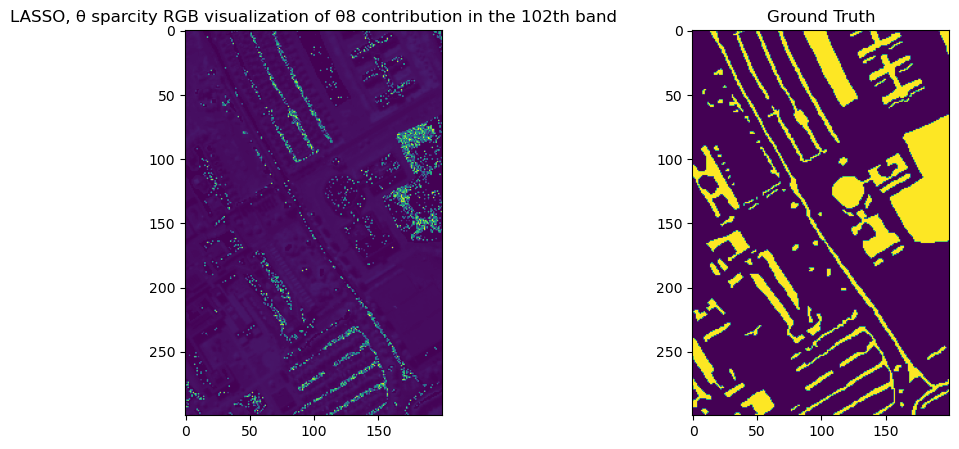

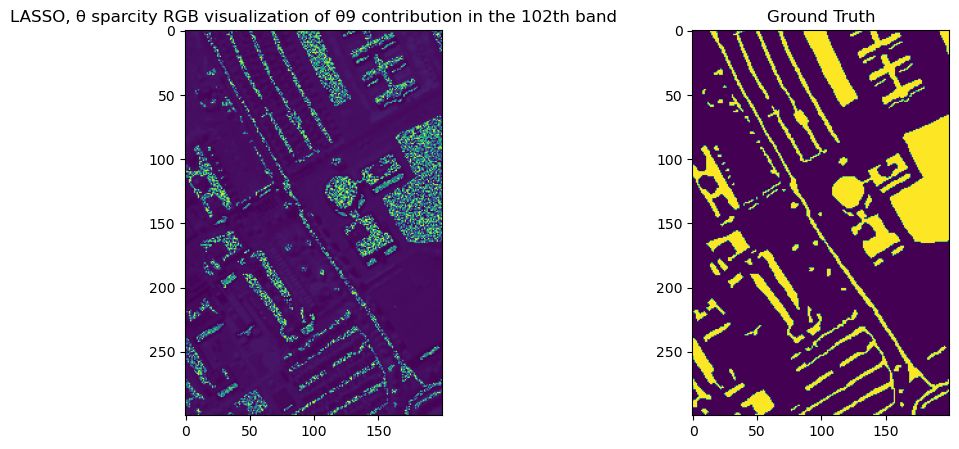

In [8]:
import matplotlib.pyplot as plt
def calculate_abundance_maps(abundance_vectors_list, HSI_copy, X, component_pos):

    # Inialize step to iterate through the list of lists
    step = 0
    for i in range(HSI_copy.shape[0]): # For i in range 300
        for j in range(HSI_copy.shape[1]): # For j in range 200
            if labels[i][j] != 0: # Check the value of the labels matrix (300x200)
                """On the following multiplication we
                Access the first element of the first list and multiply by a 103 column vector extracted from
                X, as it is the endmembers matrix!"""
                # Check for NaN or infinite values
                if np.isfinite(abundance_vectors_list[step][component_pos]):
                    # Multiply only if the value is finite
                    HSI_copy[i][j] = abundance_vectors_list[step][component_pos] * X[:, component_pos]
                else:
                    # Handle NaN or infinite values as needed
                    HSI_copy[i][j] = 0 # Set to zero
                step += 1 # Increment by one

    return HSI_copy



# Function to use the calculate_abundance_maps function to create and show the abundance maps
def derive_abundance_maps(thetas_list, HSI, X, method_name):

    # Iterate through the list of lists as it was an numpy darray
    for i in range(np.array(thetas_list).shape[1]):
        # Call the calculate_abundance_maps to create a new 3D array with
        # the contribution of each of the thetas in Θ = [θ1, θ2, ..., θ9].Τ
        HSI_component = calculate_abundance_maps(thetas_list, HSI, X, component_pos=i)

        # Show the 10th band for each of the 9 thetas
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        spectral_band = 102
        # Plot the abundance map
        axes[0].imshow(HSI_component[:, :, spectral_band] )
        axes[0].set_title(f'{method_name} RGB visualization of θ{i+1} contribution in the {spectral_band}th band')

        # Plot Ground Truth
        axes[1].imshow(labels != 0)  # Show non-zero labels
        axes[1].set_title(f'Ground Truth')

all_methods = [
    thetas_no_constraints,
    thetas_sum_to_one,
    thetas_non_neg,
    thetas_both_constraints,
    thetas_lasso
]
names = [
    "LS no constraints", "LS sum-to-one constraint",
    "LS non-negative constraint", "LS both constraints", "LASSO, θ sparcity"
]
name = 0 # Value to count the iterations and essentially return
            # the corresponding name of the method  under use each time.
for theta_list in all_methods:

    derive_abundance_maps(theta_list, HSI, X, names[name])
    name+=1 # Increment by one

### (A): (ii):


In [9]:
from tabulate import tabulate
mean1 = np.mean(df_no_constraints['PixelReconError'], axis=0)
mean2 = np.mean(df_sum_to_one['PixelReconError'], axis=0)
mean3 = np.mean(df_non_neg['PixelReconError'], axis=0)
mean4 = np.mean(df_both_constraints['PixelReconError'], axis=0)
mean5 = np.mean(df_lasso['PixelReconError'], axis=0)



# Create a table with tabulate
table = [["LS No Constraints", mean1],
         ["LS Sum to One", mean2],
         ["LS Non-Negative", mean3],
         ["LS Both Constraints", mean4],
         ["Lasso θ sparcity", mean5]]

# Print the table
print(tabulate(table, headers=["Method", "Reconstruction Error" ], tablefmt="grid"))

+---------------------+------------------------+
| Method              |   Reconstruction Error |
+=====================+========================+
| LS No Constraints   |       118783           |
+---------------------+------------------------+
| LS Sum to One       |       160050           |
+---------------------+------------------------+
| LS Non-Negative     |       569339           |
+---------------------+------------------------+
| LS Both Constraints |            4.90404e+07 |
+---------------------+------------------------+
| Lasso θ sparcity    |            1.186e+14   |
+---------------------+------------------------+


<h4 align='Center'> (B):</h4>




Based on the reconstruction error, the Least Squares method with no constraints imposed is the best-performing method strictly in terms of reconstruction error, with the LS constraint under the sum-to-one constraint being a close second-best method. In more detail, theoretically having the lowest reconstruction error indicates that this particular method is more capable of reconstructing each pixel. Alternatively, we can say it is the most accurate at estimating the percentage contribution for each of the 9 materials as sub-pixel information, in contrast to the other methods used.

From the plots above, we can see that the LS method with the non-negative constraint is the one reconstructing the actual Pavia University image (visualized at a specific band), meaning that this particular method is the best among the 5 used. Such an outcome is expected for the simple reason that non-negativity has a physical meaning, as the sum-to-one does, because the θ1, θ2, θ3, ..., θ9 are expected to represent percentages in our Spectral Unmixing task.

As a matter of fact, the LS method with both constraints was expected to outmatch every other method because the sum-to-one and negative constraints match with the task at hand, that is, to estimate the percentage contribution of each of the 9 materials analyzed. But, visually, that is not the case, and the reason might be that the reasoning of the sum-to-one constraint does not align with the actual sub-pixel information we are trying to analyze.

Also, it should be noted that LASSO did not provide an ideal result, and despite the θ sparsity, meaning the sparse solutions it provides, it seems to have captured a portion of the actual image. This method can be useful, but the time complexity needed along with the search for the optimal value λ are hurting this model.

All in all, the spectral unmixing proved to be a powerful task, providing us with information regarding sub-pixel information and a way, non-negativity constraints on the abundance maps, to reconstruct the original picture with valid accuracy.


<h2 align='center'> Part 2 (Classification) </h2>

### (A): (i):

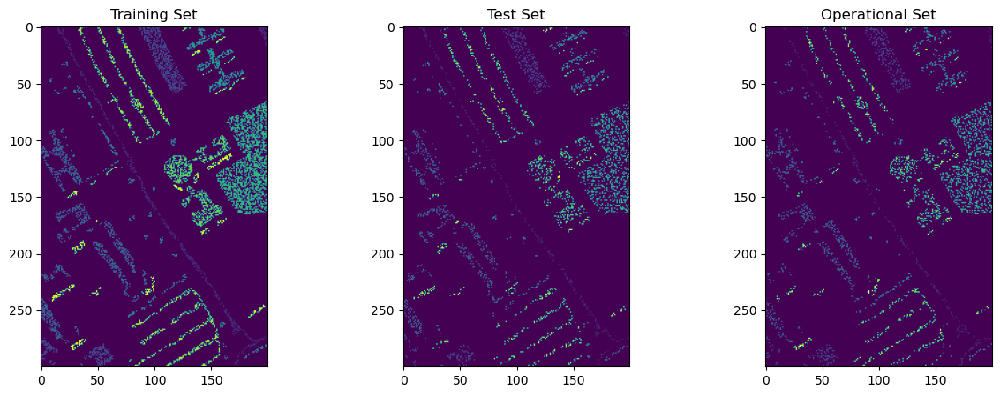

In [5]:
import numpy as np,pandas as pd, scipy.io as sio, matplotlib.pyplot as plt
# Trainining set for classification
Pavia_labels = sio.loadmat('classification_labels_Pavia.mat')
Training_Set = (np.reshape(Pavia_labels['training_set'],(200,300))).T
Test_Set = (np.reshape(Pavia_labels['test_set'],(200,300))).T
Operational_Set = (np.reshape(Pavia_labels['operational_set'],(200,300))).T

# Plot side-by-side
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Training Set
axes[0].imshow(Training_Set, cmap='viridis')
axes[0].set_title('Training Set')

# Test Set
axes[1].imshow(Test_Set, cmap='viridis')
axes[1].set_title('Test Set')

# Operational Set
axes[2].imshow(Operational_Set, cmap='viridis')
axes[2].set_title('Operational Set')

plt.show()





In [6]:
from sklearn.model_selection import cross_val_score, StratifiedKFold, KFold
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier 
from tabulate import tabulate
from scipy.stats import multivariate_normal
import numpy as np, scipy.io as sio


def calculate_class_centroids(X_train, y_train, num_classes):
    """
    Calculate centroids for each class in the training data.
    Returns: List containing centroids for each class.
    """
    class_centroids = []

    for class_label in range(1, num_classes + 1):
        class_data = X_train[y_train == class_label]
        class_centroid = np.mean(class_data, axis=0)
        class_centroids.append(class_centroid)

    return class_centroids

def euclidean_distance(x1, mu):
    """
    Calculate the Euclidean distance between two data points.
    Returns: Euclidean distance between x1 and x2.
    """
    return np.sqrt(np.sum((x1 - mu)**2))

def min_distance_classifier(data_point, class_centroids):
    """
    Classify a data point based on the minimum Euclidean distance to class centroids.
    Returns: Predicted class label for the data point.
    """
    distances = [euclidean_distance(data_point, centroid) for centroid in class_centroids]
    return np.argmin(distances) + 1

def cross_val_min_distance_classifier(X_train, y_train, num_classes, cv):
    """
    Perform cross-validation using the minimum distance classifier.
    Returns: List containing accuracy for each fold.
    """
    kf = KFold(n_splits=cv, shuffle=True, random_state=42)

    accuracies = []

    for train_index, test_index in kf.split(X_train, y_train):
        X_train_fold, X_test_fold = X_train[train_index], X_train[test_index]
        y_train_fold, y_test_fold = y_train[train_index], y_train[test_index]

        # Calculate class centroids on the training fold
        class_centroids = calculate_class_centroids(
            X_train_fold, y_train_fold, num_classes)

        # Classify each data point in the test fold
        predictions = [min_distance_classifier(data_point, class_centroids) for data_point in X_test_fold]

        # Calculate accuracy for the current fold
        accuracy = np.mean(predictions == y_test_fold)
        accuracies.append(accuracy)

    return accuracies


def calculate_apriori_probabilities(array):
    """
    Calculate apriori probabilities for each unique value in a 1-dimensional array.
    Returns: Dictionary containing values and their corresponding apriori probabilities.
    """
    unique_values, counts = np.unique(array, return_counts=True)
    total_elements = len(array)

    apriori_probabilities = {value: count / total_elements for value, count in zip(unique_values, counts)}

    return apriori_probabilities
#print(calculate_apriori_probabilities(y_train))
def calculate_statistics(X_train, y_train):
    """
    Calculate mean and covariance for each class in the training data.
    Returns:DataFrame containing Class, Mean, and Covariance for each class.
    """
    result_df = pd.DataFrame(columns=['Class', 'Mean', 'Covariance'])

    for label in np.unique(y_train):
        group_data = X_train[y_train == label]
        mean_value = group_data.mean(axis=0)    
        covariance_matrix = np.cov(group_data, rowvar=False)

        result_df = pd.concat([result_df, pd.DataFrame(
            {'Class': [label], 'Mean': [mean_value], 'Covariance': [covariance_matrix]})], ignore_index=True)

    return result_df

def build_distributions(statistics_df):
    """
    Build multivariate normal distributions for each class based on mean and covariance.
    Returns: Dictionary containing class labels and corresponding multivariate normal distributions.
    """
    distributions = {}
    for index, row in statistics_df.iterrows():
        class_label = row['Class']
        mean = row['Mean']
        covariance_matrix = row['Covariance']
        distribution = multivariate_normal(mean=mean, cov=covariance_matrix)
        distributions[class_label] = distribution

    return distributions


def calculate_posterior_probabilities(X_test, distributions, apriori_probs):
    """
    Calculate posterior probabilities for each class in the test data.
    Returns:Dictionary containing class labels and their corresponding posterior probabilities.
    """
    posterior_probabilities = {}

    for class_label, distribution in distributions.items():
        likelihood = distribution.pdf(X_test)
        prior_probability = apriori_probs[class_label]
        posterior_probability = likelihood * prior_probability
        posterior_probabilities[class_label] = posterior_probability
        
    return posterior_probabilities

def classify_data(X_test, posterior_probabilities):
    """
    Classify each row in the test data based on the class with the highest posterior probability.
    Returns: NumPy array containing the predicted class for each row in the test data.
    """
    predicted_classes = np.argmax(
        np.array(
            [posterior_probabilities[class_label] for class_label in sorted(
                posterior_probabilities.keys())]), axis=0) + 1

    return predicted_classes



def bayesian_cross_validate(X_train, y_train, num_folds):
    """
    Perform cross-validation on a classifier using the provided functions.
    Returns: Average accuracy over all folds.
    """
    # Initialize StratifiedKFold with the specified number of folds
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

    # Initialize variables to store performance metrics
    accuracies = []

    # Iterate over folds
    for train_index, test_index in kf.split(X_train, y_train):
        X_train_fold, X_test_fold = X_train[train_index], X_train[test_index]
        y_train_fold, y_test_fold = y_train[train_index], y_train[test_index]

        # Train and evaluate your classifier using the provided functions
        statistics_df = calculate_statistics(X_train_fold, y_train_fold)
        distributions = build_distributions(statistics_df)
        apriori_probs = calculate_apriori_probabilities(y_train_fold)
        posterior_probabilities = calculate_posterior_probabilities(X_test_fold, distributions, apriori_probs)
        predicted_classes = classify_data(X_test_fold, posterior_probabilities)

        # Calculate accuracy for the current fold
        accuracy = np.mean(predicted_classes == y_test_fold)
        accuracies.append(accuracy)

    return accuracies



def filter_HSI_by_labels(HSI, set_y):
    unique_values, counts = np.unique(set_y, return_counts=True)

    # Find the index of the value 0 in unique_values
    value_index = np.where(unique_values == 0)[0]

    # Extract the count corresponding to the value 0
    count_for_value_0 = counts[value_index]
    # Number of rows to expect
    rows = (300 * 200) - count_for_value_0[0]

    Χ = np.empty((rows, 103))
    y = np.empty(rows)
    # pointer
    index = 0
    for i in range(300):
        for j in range(200):
            if set_y[i, j] != 0:
                y[index] = set_y[i, j]
                Χ[index, :] = HSI[i, j, :]
                index += 1
    return Χ, y

Pavia = sio.loadmat('PaviaU_cube.mat')
HSI = Pavia['X'] #Pavia HSI : 300x200x103

# Training set of labels
labels_train  = Training_Set
# Test set of labels
labels_test = Test_Set

# Operational set of labels
labels_operation = Operational_Set



# Get the relative, to the train labels, pixels
X_train, y_train = filter_HSI_by_labels(HSI, labels_train)

# Get the relative, to the test labels, pixels
X_test, y_test = filter_HSI_by_labels(HSI, labels_test)

# Get the relative, to the operational labels, pixels
X_operation, y_operation = filter_HSI_by_labels(HSI, labels_operation)


# Use np.column_stack to stack X_train and y_train horizontally
stacked_data = np.column_stack((X_train, y_train))


# Create a DataFrame from the stacked data
columns = [f'feature_{i}' for i in range(X_train.shape[1])] + ['label']
train_data = pd.DataFrame(data=stacked_data, columns=columns)


# Use np.column_stack to stack X_test and y_test horizontally
stacked_test_data = np.column_stack((X_test, y_test))

# Create a DataFrame from the stacked test data
test_data_columns = [f'feature_{i}' for i in range(X_test.shape[1])] + ['label']
test_data = pd.DataFrame(data=stacked_test_data, columns=test_data_columns)





table_data = [
    ["Training", X_train.shape, y_train.shape],
    ["Test", X_test.shape, y_test.shape],
    ["Operational", X_operation.shape, y_operation.shape]
]

# Specify headers for the table
headers = ["Dataset", "Features (X) Shape", "Labels (y) Shape"]

# Print the table
table = tabulate(table_data, headers, tablefmt="grid")
print(table)

# Define a list of classifiers
classifiers = [
    MultinomialNB(),
    KNeighborsClassifier(),
    min_distance_classifier,
    f"BayesianClassifier"
]

# List to store the results
results = []

# Iterate over each classifier
for classifier in classifiers:
    # Store the classifier
    clf = classifier


    if callable(clf):
        # Perform 10-fold cross validation with Euclidean (custom function)
        cv_scores = cross_val_min_distance_classifier(X_train, y_train, 9, 10)
        clf_name = 'MinimumDistanceEuclidean'
    elif clf == 'BayesianClassifier':
        cv_scores = bayesian_cross_validate(X_train, y_train, num_folds=10)
        clf_name = 'BayesianClassifier'

    else:
        # Otherwise, use the provided classifier
        # Perform 10-fold cross_calidation
        kf = KFold(n_splits=10, shuffle=True, random_state=42)
        cv_scores = cross_val_score(clf, X_train, y_train, cv=kf, scoring='accuracy')
        # Get the name of the classifier for printing
        clf_name = type(classifier).__name__

    # Calculate mean and standard deviation of the cross-validation scores
    mean_accuracy = np.mean(cv_scores)
    std_accuracy = np.std(cv_scores)


    # Calculate mean validation error
    mean_validation_error = 1 - mean_accuracy


    # Store the results
    results.append({
        'Classifier': clf_name,
        'Mean_Val_Error': mean_validation_error,
        'Std_CV_Scores': std_accuracy
    })

# Print the results as a table
table_data = []
for result in results:
    table_data.append([result['Classifier'], result['Mean_Val_Error'], result['Std_CV_Scores']])

headers = ["Classifier", "Mean Validation Error", "Std of CV Scores"]
table = tabulate(table_data, headers, tablefmt="grid")

print("\n\n",table)

+-------------+----------------------+--------------------+
| Dataset     | Features (X) Shape   | Labels (y) Shape   |
+=============+======================+====================+
| Training    | (6415, 103)          | (6415,)            |
+-------------+----------------------+--------------------+
| Test        | (3207, 103)          | (3207,)            |
+-------------+----------------------+--------------------+
| Operational | (3207, 103)          | (3207,)            |
+-------------+----------------------+--------------------+


 +--------------------------+-------------------------+--------------------+
| Classifier               |   Mean Validation Error |   Std of CV Scores |
+==========================+=========================+====================+
| MultinomialNB            |                0.368508 |          0.0268386 |
+--------------------------+-------------------------+--------------------+
| KNeighborsClassifier     |                0.120031 |          0.0142555 |
+

# (A): (ii):

MultinomialNB Success Rate: 63.61%


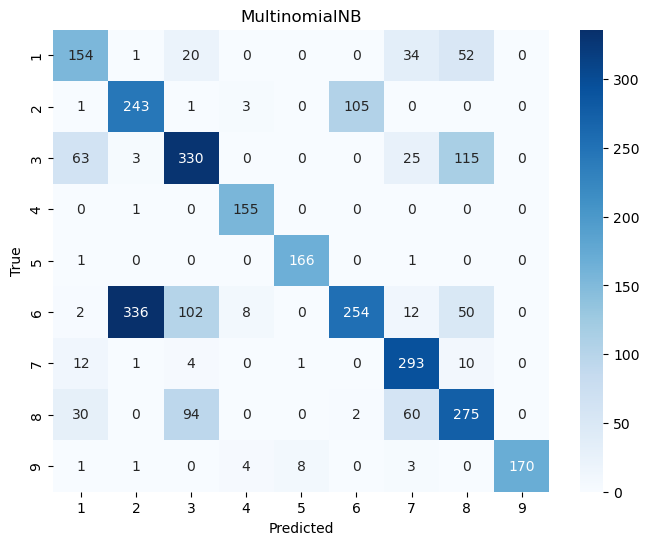

KNeighborsClassifier Success Rate: 88.84%


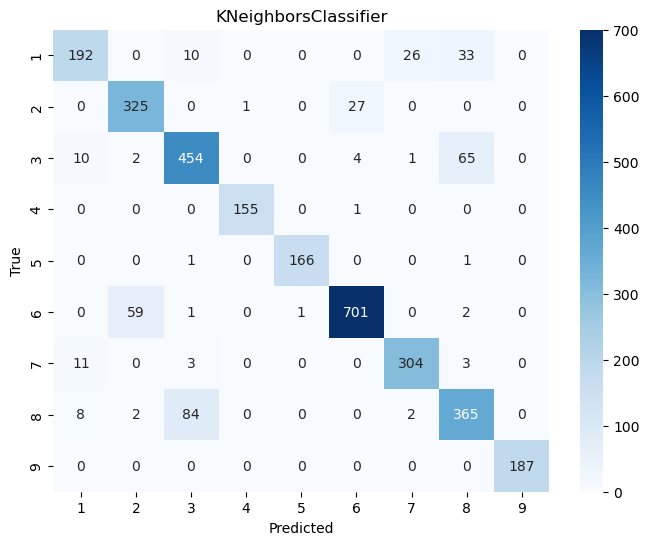

MinimumDistanceEuclidean Success Rate: 55.78%


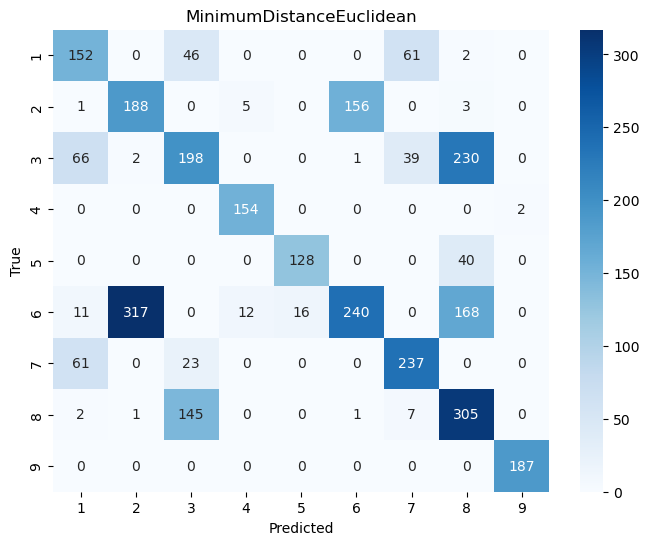

BayesianClassifier Success Rate: 88.28%


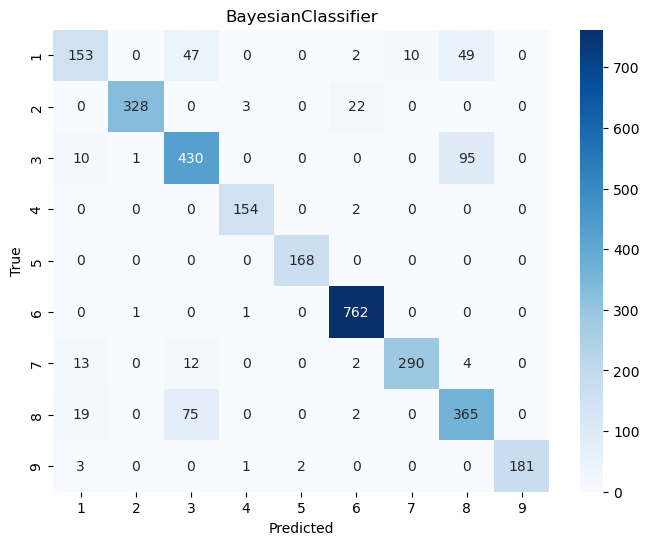

In [7]:
from sklearn.metrics import confusion_matrix
from matplotlib.colors import LogNorm
import seaborn as sns

def train_and_evaluate_classifier(classifier, X_train, y_train, X_test, y_test):
    """
    Train a classifier on the entire training set and compute the confusion matrix on the test set.
    Returns:Confusion matrix computed on the test set.
    """
    # Train the classifier on the entire training set
    classifier.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = classifier.predict(X_test)

    # Compute the confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    

    return conf_matrix

def euclidean_train_evaluate(X_train, y_train, X_test, y_test, num_classes):
    """
    Train and evaluate the Euclidean-based classifier on the entire training set and compute the confusion matrix.
    Returns: Confusion matrix computed on the test set.
    """
    # Calculate class centroids on the entire training set
    class_centroids = calculate_class_centroids(X_train, y_train, num_classes)

    # Classify each data point in the test set
    predictions = [min_distance_classifier(data_point, class_centroids) for data_point in X_test]

    # Compute the confusion matrix
    conf_matrix = confusion_matrix(y_test, predictions)


    return conf_matrix


def bayesian_train_evaluate(X_train, y_train, X_test, y_test):

    # Calculate statistics (mean and covariance) for each class in the training data
    statistics_df = calculate_statistics(X_train, y_train)
    # Build multivariate normal distributions for each class based on calculated statistics
    distributions = build_distributions(statistics_df)
    # Calculate a priori probabilities for each class in the training data
    apriori_probs = calculate_apriori_probabilities(y_test)
    # Calculate posterior probabilities for each class in the test data
    posterior_probabilities = calculate_posterior_probabilities(X_test, distributions, apriori_probs)
    # Classify each row in the test data based on the class with the highest posterior probability
    predicted_classes = classify_data(X_test, posterior_probabilities)

    # Create the confusion matrix and classification report
    conf_matrix = confusion_matrix(y_test, predicted_classes)


    return conf_matrix


# Function to compute the accuracy (success rate) from a confusion matrix.
def compute_success_rate(conf_matrix):
    # Diagonal sum
    diagonal_sum = np.trace(conf_matrix)
    # Total number of elements
    total_sum = np.sum(conf_matrix)
    accuracy = diagonal_sum / total_sum
    return accuracy


# Function to plot confusion matrix using seaborn heatmap
def plot_confusion_matrix(conf_matrix, class_names, title):
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()




# Define a list of classifiers
classifiers = [
    MultinomialNB(),
    KNeighborsClassifier(n_neighbors =7),
    min_distance_classifier,
    f"Bayesian_classifier"
]


# Initialize a list to store the results
confusion_matrix_results = []
# Iterate over each classifier
for classifier in classifiers:
    # Store  the classifier
    clf = classifier

    if  callable(clf):
        # If it's Euclidean, use the provided function
        conf_matrix = euclidean_train_evaluate(X_train, y_train, X_test, y_test, 9)
        clf_name = 'MinimumDistanceEuclidean'
    elif  clf == 'Bayesian_classifier':
        # If it's Bayesian, use the provided function
        conf_matrix  = bayesian_train_evaluate(X_train,y_train, X_test, y_test )
        clf_name = 'BayesianClassifier'
    else:
        # Otherwise, use the provided classifier
        conf_matrix  = train_and_evaluate_classifier(
            clf, X_train, y_train, X_test, y_test)
        clf_name = type(classifier).__name__

    success_rate =  compute_success_rate(conf_matrix)


    # Append the results to the list
    confusion_matrix_results.append({
        "Classifier": clf_name,
        "Success Rate": success_rate,
        "Confusion Matrix": conf_matrix,

    })

   # print(f"{clf_name} Classification Report:\n {classification_rep}")

# Plot confusion matrices one at a time
class_names = [str(c) for c in range(1, 10)]

for result in confusion_matrix_results:
    print(f"{result['Classifier']} Success Rate: {result['Success Rate']:.2%}")
    plot_confusion_matrix(result["Confusion Matrix"], class_names, result["Classifier"])

    plt.show()  # Display one confusion matrix at a time


### (B):

The success rates indicate that the K-Nearest Neighbors classifier is the best-performing classifier among all the classifiers under study, with Bayesian classifier being a close second.

By comparing the four matrices to each other, based on the darkness of color and the number of elements resting on the main diagonal, we can confidently say that the Minimum KNN classifier along with the Bayesian classifier are the two classifiers with the highest success rate.


<h4 align='center'>K-Nearest neighbors Classifier</h4>
The K-Nearest Neighbors (KNN) classifier exhibited notable challenges in distinguishing between certain classes. Specifically, it often misclassified instances of class 8 as class 3, with a total of 84 occurrences. Additionally, there was a recurring issue where the classifier predicted class 6 for instances that actually belonged to class 2, and this misclassification was observed in 59 instances. Another noteworthy confusion involved instances of class 3 being inaccurately identified as class 8, with a total of 65 instances.


<h4 align='center'>Bayesian Classifier</h4>
As for the Bayesian classifier, it is evident that the classifier was capable of predicting many classes correctly based on the computed success rate. However, the classifier frequently confused class 8 with class 3, with a total of 75 instances. Additionally, there were instances where class 1 was incorrectly predicted as class 3 in 47 instances and as class 8 in 49 instances. Furthermore, class 3 was confused with class 8 in 95 instances.


All in all, even though the KNN classifier is slightly better at classifying based on the Test Set, the Bayesian classifier is also a good choice to consider. However, the KNN classifier does not impose any assumptions about the underlying distribution of our data, in contrast to the Bayesian classifier that explicitly hypothesizes that the underlying distribution of the pixels in the 103 bands is a multivariate normal distribution for each of the classes. But, based on the 88% success rate of the Bayesian classifier, the assumption of normality might not be unfounded.Lastly, it should also be noted that, these results showed a difference to the Cross Validation results, meaning that, the Bayesian was the best, Minimum Distance Euclidean and Multinomial Naive Bayes had better performance in their evaluation there.

<h2 align='center'> Part 3 (combination) </h1>


The correlation between the results obtained from the spectral unmixing procedure and those obtained from classification can provide valuable insights into how well the information derived from spectral analysis aligns with the classification outcomes. In particular, examining whether the abundance maps generated in the spectral unmixing process contribute meaningfully to the classification results is crucial. If there is a strong correlation, it suggests that the spectral information used in unmixing is influential in determining the class assignments in the classification process.

On the other hand, a weak correlation might indicate that other factors or features play a more significant role in the classification results, independent of the spectral signatures. Analyzing this correlation can contribute to a comprehensive understanding of the overall performance and synergy between these two essential parts in this hyperspectral image processing project/task.